## Assihnment 7
1. What do you mean by feature scaling ? 
   Explain feature scaling techniques with examples.
   Which technique should we use incase there are a lot of outliers in the dataset?

2. Explain difference between feature selection and dimensionality reduction.
   Explain the techniques of feature selection and dimensionality reduction with examples.

3. Choose any dataset (which solves linear regression/logistic regression) from the internet and apply data transformation techniques 
   (feature scaling, selection, dimensionality reduction, data cleaning etc) and transform the dataset.

4. In the above dataset, observe how does the model performance change with and without data transformation techniques.

In [28]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [13]:
df=pd.read_csv('wine.csv')
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,bad
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,bad
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,bad
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,good
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,bad
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,bad
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,good
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,good
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,bad


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   object 
dtypes: float64(11), object(1)
memory usage: 150.0+ KB


In [15]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000


In [16]:
df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595


In [17]:
df['quality']=df['quality'].replace({'good':1,'bad':0})
df['quality'].describe()

count    1599.000000
mean        0.534709
std         0.498950
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: quality, dtype: float64

In [18]:
df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.095093
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.321441
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.159129
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,-0.002160
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.109494
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.061757
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.231963
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.159110
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.003264
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.218072


In [25]:
cols=list(df.columns.values)
cols

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality']

AxesSubplot(0.125,0.125;0.775x0.755)


C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


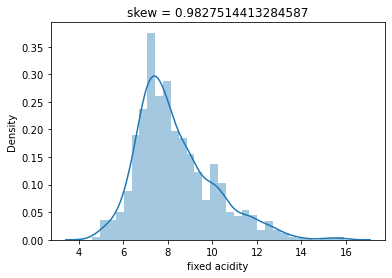

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


AxesSubplot(0.125,0.125;0.775x0.755)


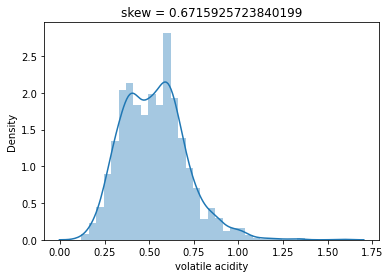

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


AxesSubplot(0.125,0.125;0.775x0.755)


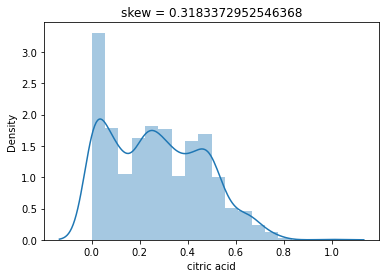

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


AxesSubplot(0.125,0.125;0.775x0.755)


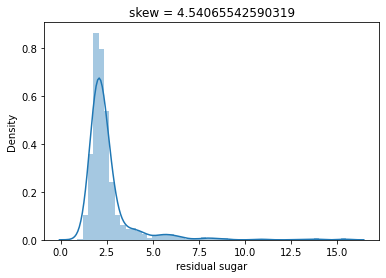

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


AxesSubplot(0.125,0.125;0.775x0.755)


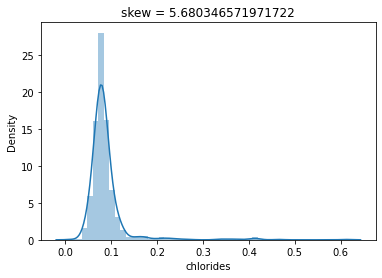

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


AxesSubplot(0.125,0.125;0.775x0.755)


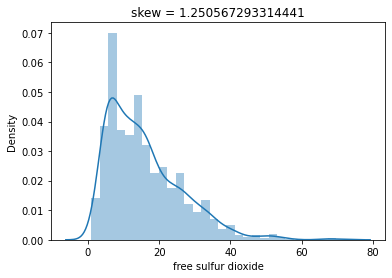

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


AxesSubplot(0.125,0.125;0.775x0.755)


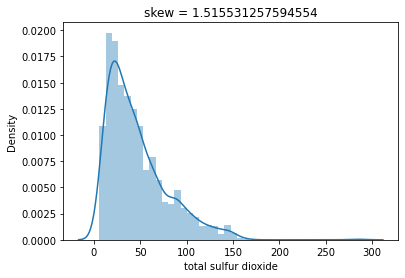

AxesSubplot(0.125,0.125;0.775x0.755)


C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


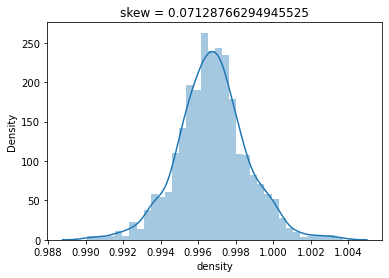

AxesSubplot(0.125,0.125;0.775x0.755)


C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


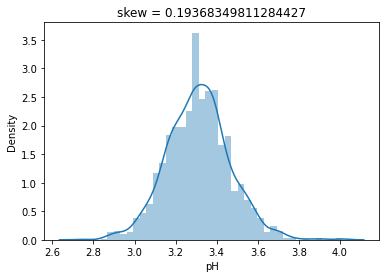

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


AxesSubplot(0.125,0.125;0.775x0.755)


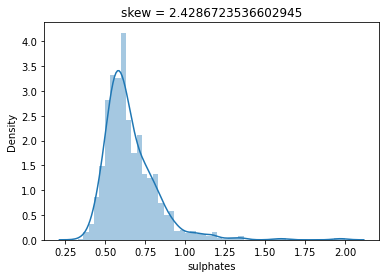

AxesSubplot(0.125,0.125;0.775x0.755)


C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


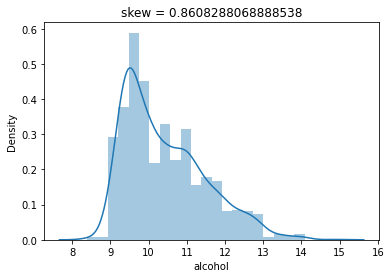

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


AxesSubplot(0.125,0.125;0.775x0.755)


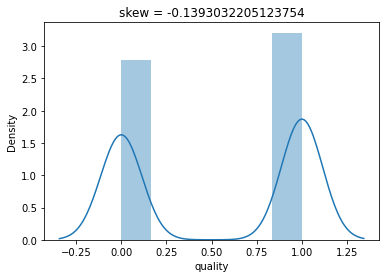

In [41]:
outliers_cols=[]
for i in cols:
    s=df[i].skew()
    if s>1:
        outliers_cols.append(i)
    #plt.figsize()
    print(sns.distplot(df[i]))
    plt.xlabel(i)
    plt.title('skew = '+str(s))
    plt.show()

In [38]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MaxAbsScaler

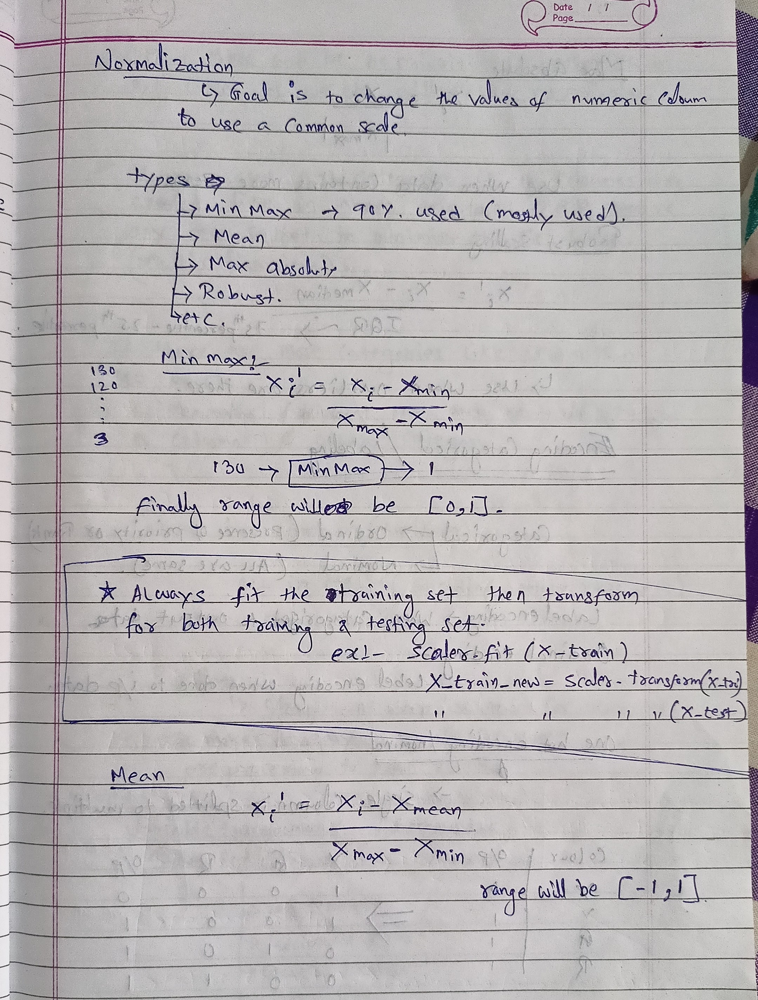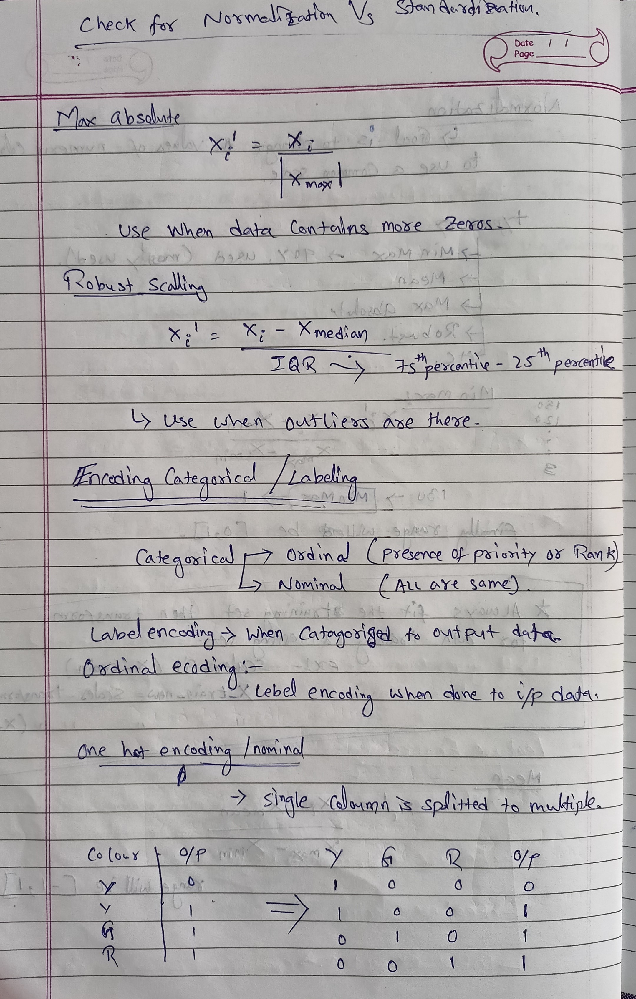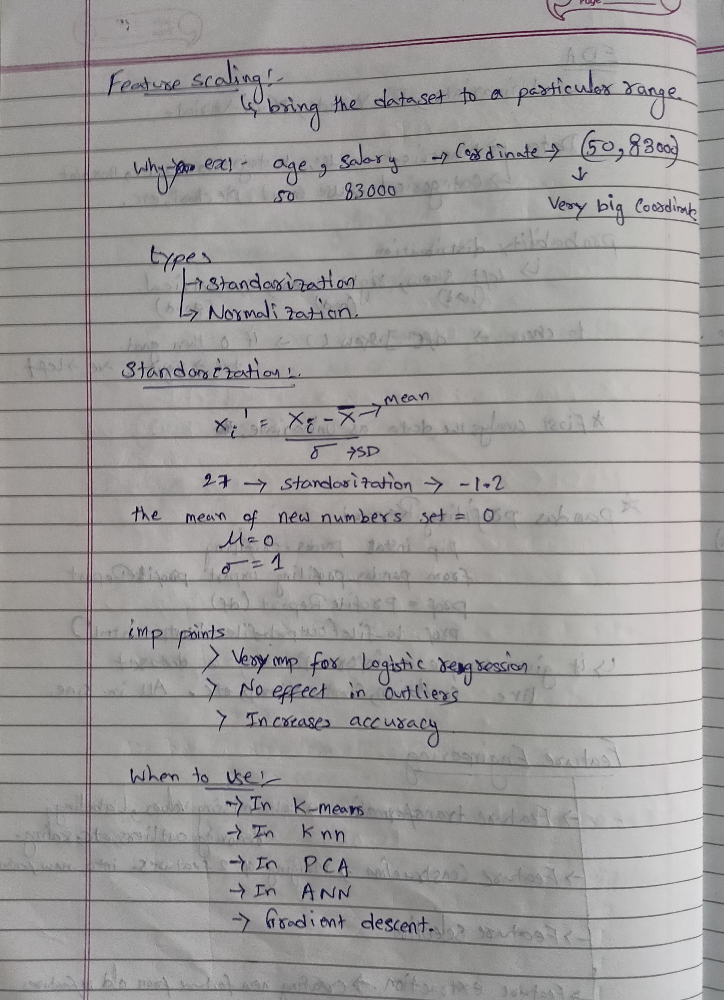

In [42]:
outliers_cols

['residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'sulphates']

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


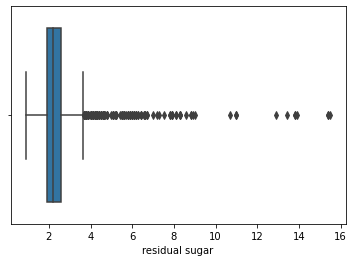

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


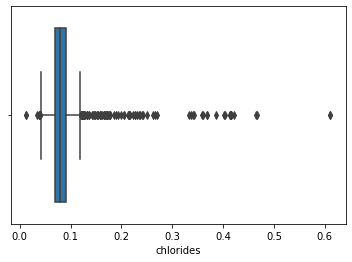

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


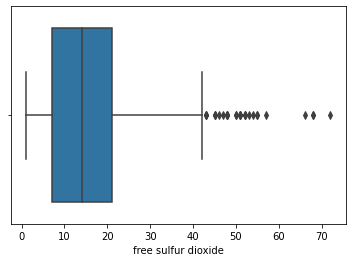

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


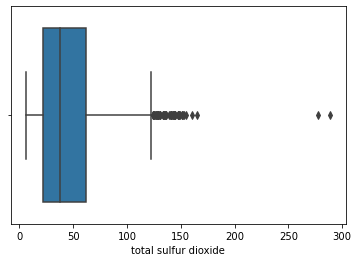

C:\Users\N CH SHANMUKHA\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


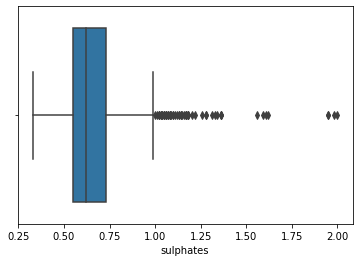

In [43]:
for i in outliers_cols:
    sns.boxplot(df[i])
    plt.xlabel(i)
    plt.show()

In [44]:
from sklearn.decomposition import PCA

In [46]:
x=df.iloc[:,:-1]
y=df['quality']

In [48]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x, y, test_size=0.33, random_state=32)

In [74]:
scaler =  StandardScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [75]:
x_train_scaledf = pd.DataFrame(x_train_scaled, columns=x_train.columns)
x_test_scaledf = pd.DataFrame(x_test_scaled, columns=x_test.columns)

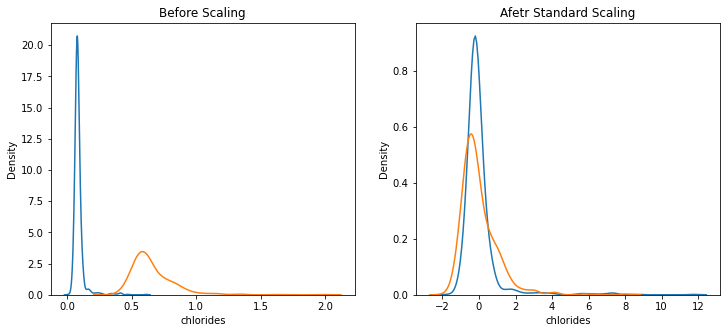

In [76]:
def scale_plot(scale):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

    # before scaling
    ax1.set_title('Before Scaling')
    sns.kdeplot(x_train['chlorides'], ax=ax1)
    sns.kdeplot(x_train['sulphates'], ax=ax1)

    # after scaling
    ax2.set_title(scale)
    sns.kdeplot(x_train_scaledf['chlorides'], ax=ax2)
    sns.kdeplot(x_train_scaledf['sulphates'], ax=ax2)
    plt.show()
    return
scale_plot('Afetr Standard Scaling')

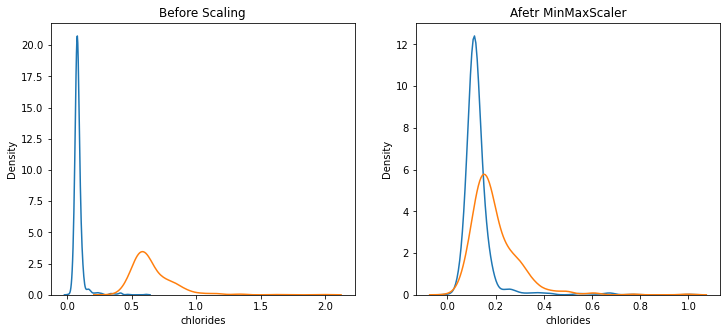

In [71]:
scaler =  MinMaxScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)
x_train_scaledf = pd.DataFrame(x_train_scaled, columns=x_train.columns)
x_test_scaledf = pd.DataFrame(x_test_scaled, columns=x_test.columns)
# x_train,x_test=x_train_scaled,x_test_scaled
# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))
scale_plot('Afetr MinMaxScaler')
# before scaling

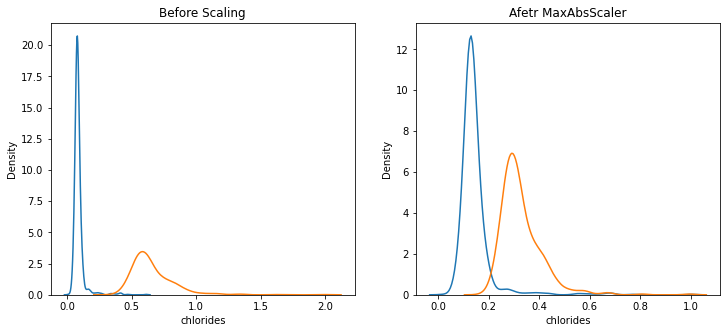

In [79]:
scaler =  MaxAbsScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)
x_train_scaledf = pd.DataFrame(x_train_scaled, columns=x_train.columns)
x_test_scaledf = pd.DataFrame(x_test_scaled, columns=x_test.columns)
# x_train,x_test=x_train_scaled,x_test_scaled
# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))
scale_plot('Afetr MaxAbsScaler')

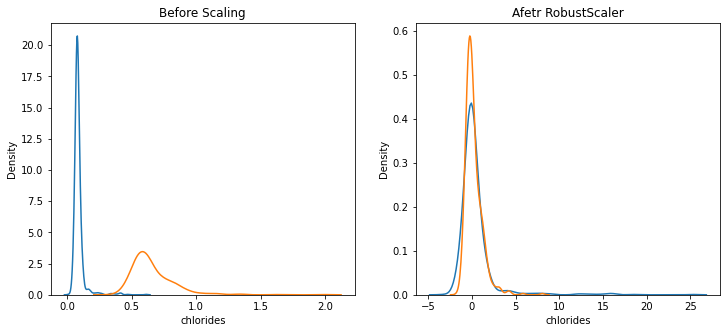

In [65]:
scaler =  RobustScaler()
scaler.fit(x_train)
x_train_scaled = scaler.transform(x_train)
x_test_scaled = scaler.transform(x_test)
x_train_scaledf = pd.DataFrame(x_train_scaled, columns=x_train.columns)
x_test_scaledf = pd.DataFrame(x_test_scaled, columns=x_test.columns)
# x_train,x_test=x_train_scaled,x_test_scaled
# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))
scale_plot('Afetr RobustScaler')

clearly we can see that Robust scalling and standard scaling are alligning the grpgh/plot of all 
features by over_riding each other so for our model we can use both standard scaling as well as robust scaling 
as we know that Robust scaling are mostly used when we have outliers as our data have more outliers which we had found from box_plots. So we will go for Robust Scaling and also we will check for standard Scaling

In [80]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(solver = 'lbfgs')
model.fit(x_train_scaled,y_train)
lgr_predictions=model.predict(x_test_scaled)
train_acc=model.predict(x_train_scaled)

In [67]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,lgr_predictions),accuracy_score(y_train,train_acc)    # using Robust scalling

(0.6912878787878788, 0.7665732959850607)

In [81]:
accuracy_score(y_test,lgr_predictions),accuracy_score(y_train,train_acc)    # using MaxAbs Scaling

(0.7026515151515151, 0.7619047619047619)

In [73]:
accuracy_score(y_test,lgr_predictions),accuracy_score(y_train,train_acc)    # using MinMax Scaling

(0.6912878787878788, 0.7721755368814193)

In [78]:
accuracy_score(y_test,lgr_predictions),accuracy_score(y_train,train_acc)    # using Standard scalling

(0.6912878787878788, 0.7712418300653595)

We can see that MaxAbs Scaling gave the highest accuracy among other techniques

## USING PCA 

In [83]:
from sklearn.decomposition import PCA
principal=PCA(n_components=7)
principal.fit(x_train_scaled)
x=principal.transform(x_train_scaled)
#principal=PCA(n_components=7)
#principal.fit(Scaled_data)
y=principal.transform(x_test_scaled)
x,y

(array([[-0.29429781, -0.05045026,  0.01652914, ...,  0.03157877,
          0.00073895,  0.01291992],
        [ 0.33465244, -0.23333587,  0.08557469, ...,  0.01668698,
          0.06971495,  0.13690809],
        [ 0.12594829, -0.13013244, -0.07895096, ...,  0.0285441 ,
         -0.08733761, -0.01650334],
        ...,
        [-0.06166149, -0.42097433,  0.13765113, ...,  0.08801261,
          0.01383518,  0.00081242],
        [ 0.09847181, -0.21077584, -0.15588558, ...,  0.0035419 ,
         -0.03447237,  0.07402073],
        [-0.08597852, -0.38113218, -0.02469714, ...,  0.02178547,
          0.02956229, -0.06216819]]),
 array([[-0.05434326,  0.05982551,  0.04239165, ...,  0.09124302,
         -0.00252908, -0.04806171],
        [-0.33114002,  0.14116804, -0.06884413, ...,  0.01645139,
          0.00138357, -0.06374983],
        [-0.24832721,  0.04827174,  0.0113705 , ..., -0.04228712,
         -0.05323387, -0.00979005],
        ...,
        [ 0.16956743,  0.33010438, -0.14690244, ...,  

In [84]:
principal.components_

array([[-2.51745346e-01,  1.81171311e-01, -4.29375793e-01,
         3.63283254e-02, -1.82486017e-02,  4.70643714e-01,
         6.95930091e-01, -1.35381483e-03,  4.85869414e-02,
        -5.17594628e-02, -8.31813883e-02],
       [ 2.81335555e-01, -2.46593132e-01,  7.37493892e-01,
         1.04611540e-01,  5.89920557e-02,  2.56920475e-01,
         4.59162800e-01,  3.35130538e-03, -9.00330272e-02,
         1.29479780e-01, -6.76323878e-04],
       [ 3.25564670e-01,  6.75557535e-01,  7.71240040e-02,
         9.22272074e-02,  1.81641999e-01, -4.74281650e-01,
         2.77449448e-01,  8.01436599e-03, -9.58085193e-02,
        -1.28288485e-01, -2.50118293e-01],
       [ 2.79949936e-01,  3.05679039e-01, -3.30761819e-02,
         6.38996789e-01,  2.08975731e-02,  5.14777474e-01,
        -3.73280725e-01,  6.20256900e-03, -2.16648883e-02,
        -7.59919393e-02,  8.78849165e-02],
       [-1.84514655e-02,  1.83152908e-01, -4.89918749e-02,
        -2.49062152e-01,  5.93669142e-01,  1.94256528e-01,
  

In [85]:
principal.explained_variance_ratio_

array([0.35027168, 0.32918827, 0.07950883, 0.05808966, 0.0516087 ,
       0.04699166, 0.03333206])

In [86]:
from sklearn.decomposition import PCA
principal=PCA(n_components=5)
principal.fit(x_train_scaled)
x=principal.transform(x_train_scaled)
#principal=PCA(n_components=7)
#principal.fit(Scaled_data)
y=principal.transform(x_test_scaled)
x,y

(array([[-0.29429781, -0.05045026,  0.01652914, -0.04956196,  0.03157877],
        [ 0.33465244, -0.23333587,  0.08557469, -0.04753663,  0.01668698],
        [ 0.12594829, -0.13013244, -0.07895096,  0.01759071,  0.0285441 ],
        ...,
        [-0.06166149, -0.42097433,  0.13765113,  0.0252499 ,  0.08801261],
        [ 0.09847181, -0.21077584, -0.15588558,  0.03451391,  0.0035419 ],
        [-0.08597852, -0.38113218, -0.02469714, -0.06180382,  0.02178547]]),
 array([[-0.05434326,  0.05982551,  0.04239165,  0.02018325,  0.09124302],
        [-0.33114002,  0.14116804, -0.06884413, -0.06895317,  0.01645139],
        [-0.24832721,  0.04827174,  0.0113705 , -0.03020653, -0.04228712],
        ...,
        [ 0.16956743,  0.33010438, -0.14690244, -0.0255681 ,  0.03046802],
        [-0.33966573,  0.12805291, -0.08254341, -0.08193622,  0.07521203],
        [ 0.96650502,  1.10863642,  0.19649966, -0.20610087, -0.38420167]]))

In [88]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(solver = 'lbfgs')
model.fit(x,y_train)
lgr_predictions=model.predict(y)
train_acc=model.predict(x)

In [89]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,lgr_predictions),accuracy_score(y_train,train_acc)    # using Robust scalling

(0.6666666666666666, 0.7068160597572363)

clearly we can see that by using 5 components of PCA we are reducing our Model's accuracy by 4%.
so let we try to increase the component and check for the accuracy

In [92]:
from sklearn.decomposition import PCA
principal=PCA(n_components=9)
principal.fit(x_train_scaled)
x=principal.transform(x_train_scaled)
#principal=PCA(n_components=7)
#principal.fit(Scaled_data)
y=principal.transform(x_test_scaled)
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(solver = 'lbfgs')
model.fit(x,y_train)
lgr_predictions=model.predict(y)
train_acc=model.predict(x)
from sklearn.metrics import accuracy_score
accuracy_score(y_test,lgr_predictions),accuracy_score(y_train,train_acc)    # using Robust scalling

(0.7026515151515151, 0.7637721755368814)

Clearly we can see that by using 9 components of PCA we are achiving our goal (accuracy = 70%) 
Here we can conclude that Using PCA we really reduced the complexity level (from 11 columns to 9 columns of data) with out affecting the accuracy score
with this we can also compute/compile the model very fast.

1. What do you mean by feature scaling ? 
   Explain feature scaling techniques with examples.
   Which technique should we use incase there are a lot of outliers in the dataset?

2. Explain difference between feature selection and dimensionality reduction.
   Explain the techniques of feature selection and dimensionality reduction with examples.


# 1. The main goal of Feature scaling is to bring all the dataset to particular range / to a common scale.
    basically there are following types of feature scalling methods.
    
    1. Standard Scaling
    2. MinMax (Normalization)
    3. Robust
    4. MaxAbsolute
    5. Mean Scaling
    
And also we have some variable transformations as follows:

    1. log Transformation
    2. Reciprocal Transformation
    3. Power Transformation
    4. Box-Cox
detailed notes are given below

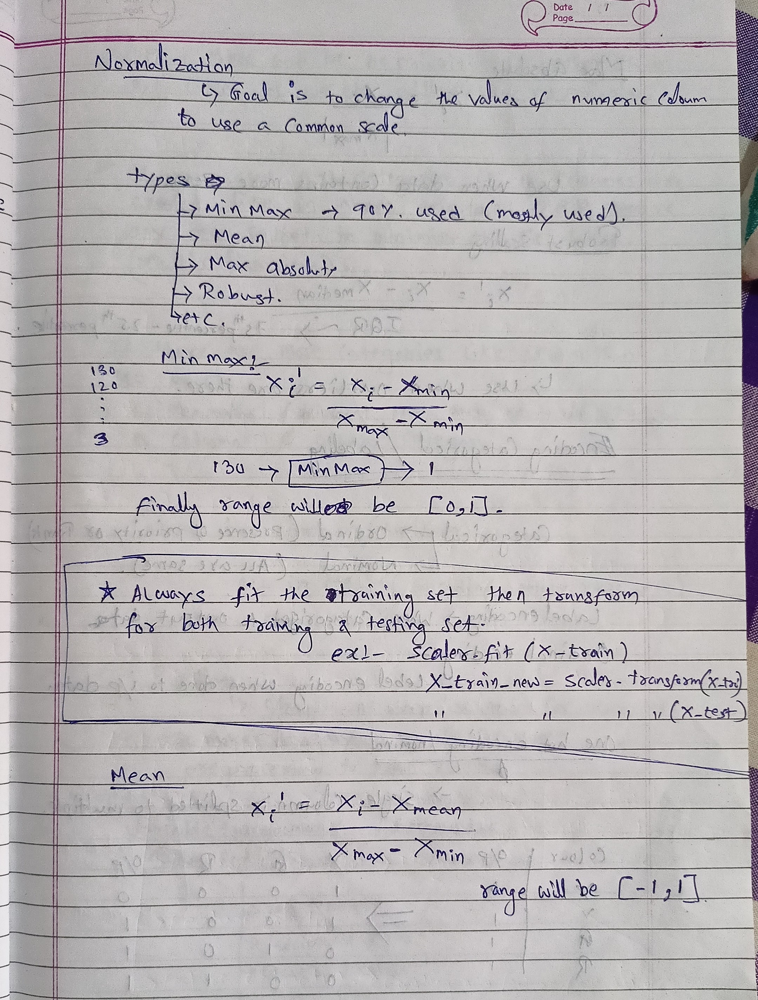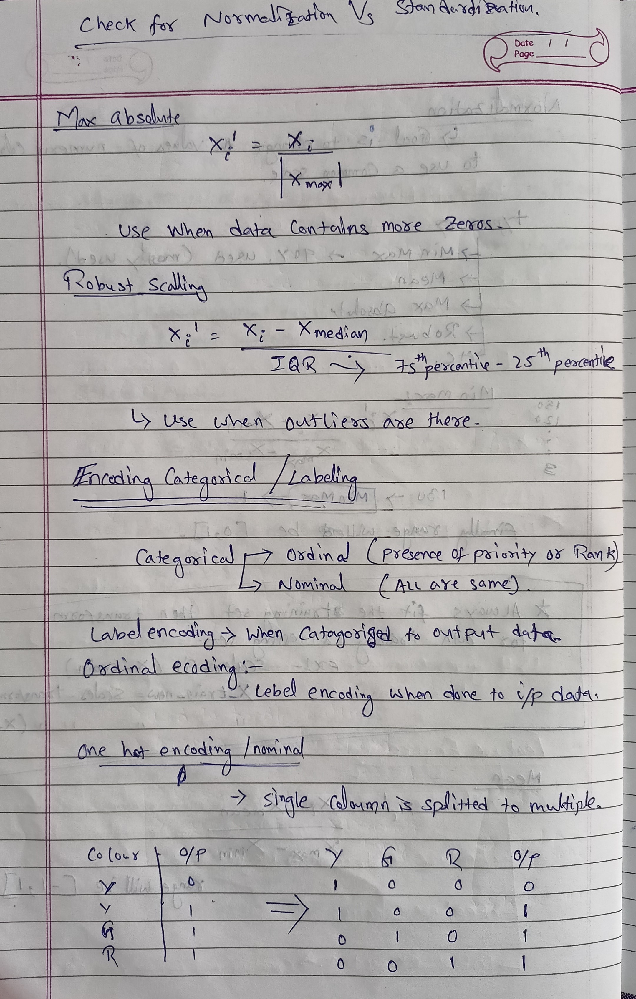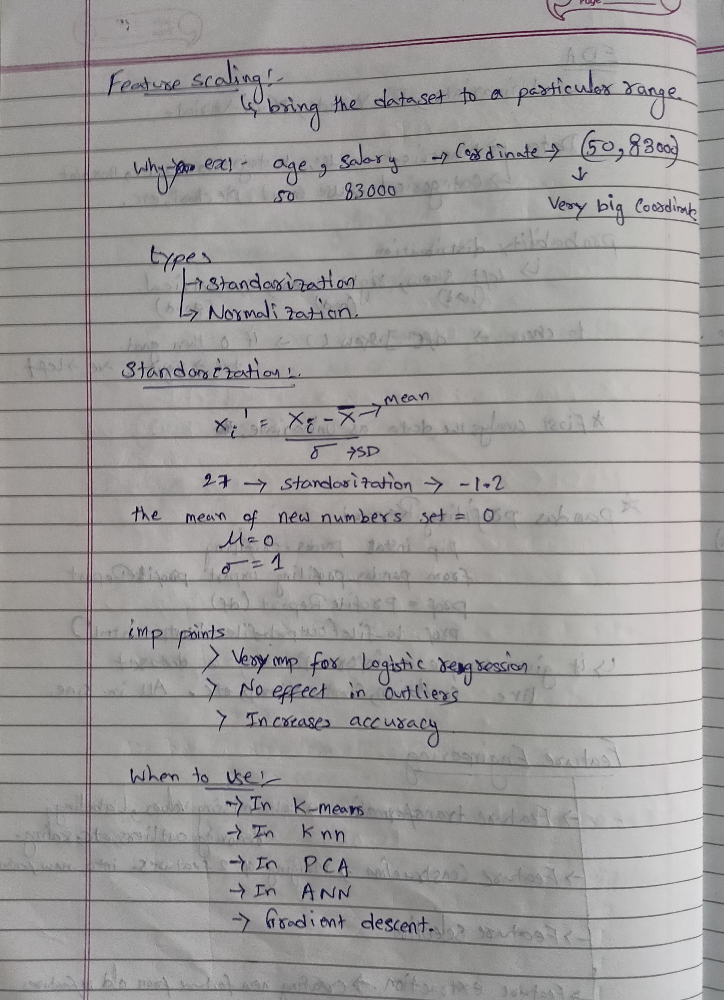

# 2. Feature selection is nothing but identifying the attribute which is having multi_colinearity or which has least correlation with target column and removing that particular columnanother technique for dropping the columns by looking into its mathmatical equation formed by the models , which has the lowest co_efficients can be removed easily.In the same way PCA works , it gives the Co-variance of the different components , through which we can decide which component has the maximum important and which does not , we can remove/ drop the components which has least variance in this way we can reduce the dimensions and we can reduce the complexity of our model wothout affecting the accuracy.